# 🧠 Logo Classification Using Transfer Learning (InceptionV3)

This notebook provides a **complete, end-to-end solution** for classifying brand logos using **Transfer Learning** with a pre-trained Keras model — specifically, **InceptionV3**.

---

## 📦 About the Dataset

The dataset was collected by students at **Atılım University**, Turkey. Videos were recorded from the food courts of several shopping malls in **Ankara**, and still images were extracted for classification. It contains **five brand logo classes**, plus a `"None"` class for images **without logos**.

The dataset is already organized into two main directories for ease of use:
- `train/`
- `test/`

---

## 🎯 Objective

Our goal is to develop a model that can help **visually impaired individuals** become aware of brand logos in their surroundings. While working on this project, we noticed that many Transfer Learning resources were either incomplete or lacked practical guidance — hence, we created and shared this notebook to help others with similar goals.

---

## 📘 Why Study This Notebook?

By studying this notebook, you’ll gain hands-on experience in:

- ✅ Importing **pre-trained Keras models and weights**
- ✅ Using **ImageDataGenerator** for training, validation, and testing
- ✅ **Augmenting** image data for improved performance
- ✅ Plotting batches of images from data generators
- ✅ Creating your own model by applying **Transfer Learning** from InceptionV3 (or any Keras-compatible model)
- ✅ Setting up and applying **callbacks** like `ModelCheckpoint` and `EarlyStopping`
- ✅ Compiling and training the model using `model.fit()`
- ✅ Calculating and using `steps_per_epoch` and `validation_steps`
- ✅ Monitoring training progress via the `history` object
- ✅ Saving and reloading the model architecture and weights
- ✅ Evaluating model performance using `model.evaluate()`
- ✅ Predicting classes on new/test images
- ✅ Decoding predicted labels
- ✅ Saving predictions and true labels to a `.csv` file
- ✅ Measuring model performance using **accuracy, precision, recall**
- ✅ Generating a detailed **classification report**
- ✅ Creating and interpreting a **confusion matrix**
- ✅ Visualizing sample predictions with true labels

---

## ✅ By the End of This Notebook, You’ll Be Able To:

- 📌 Understand and implement **Transfer Learning** in Keras
- 📌 Build and train image classification models
- 📌 Evaluate model performance using industry-standard metrics
- 📌 Document and report your results with visualizations and summaries

---

In [5]:
# Standard data science libraries
import psutil
import humanize
import os
from IPython.display import display_html

# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory

import os
print(os.listdir("C:/Users/noeln/OneDrive/Desktop/Transfer Learning CNN/logos_v3_mini/logos3"))
dataDirectory= "C:/Users/noeln/OneDrive/Desktop/Transfer Learning CNN/logos_v3_mini/logos3" 
print(os.listdir(dataDirectory))

# Any results you write to the current directory are saved as output.

['test', 'train']
['test', 'train']


In [6]:
# print(os.listdir("../input"))

## 📥 How to Download Pre-Trained Models for Transfer Learning

To use **Transfer Learning**, we first need to download a **pre-trained model and its weights**. Here's how to do it in a Kaggle Notebook:

1. On the **right toolbar**, click the "**+ Add Data**" button.
2. Search for the dataset called **"Keras Pretrained Models"**.
3. Add it to your notebook.
4. Then run the following code to copy the necessary files into the local `~/.keras/models` directory (where Keras looks for pre-trained weights):

In [ ]:
from tensorflow.keras.applications import VGG19

# Load pre-trained VGG19 without top layer
model = VGG19(weights='imagenet', include_top=False)

# If you want to see model summary
model.summary()

Model: "vgg19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, None, None, 3)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, None, None, 64) │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, None, None, 64) │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, None, None, 64) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, None, None,     │        73,856 │
│                                 │ 128)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, None, None,     │       147,584 │
│                                 │ 128)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, None, None,     │             0 │
│                                 │ 128)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, None, None,     │       295,168 │
│                                 │ 256)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, None, None,     │       590,080 │
│                                 │ 256)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, None, None,     │       590,080 │
│                                 │ 256)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv4 (Conv2D)           │ (None, None, None,     │       590,080 │
│                                 │ 256)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, None, None,     │             0 │
│                                 │ 256)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, None, None,     │     1,180,160 │
│                                 │ 512)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, None, None,     │     2,359,808 │
│                                 │ 512)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, None, None,     │     2,359,808 │
│                                 │ 512)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv4 (Conv2D)           │ (None, None, None,     │     2,359,808 │
│                                 │ 512)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, None, None,     │             0 │
│                                 │ 512)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, None, None,     │     2,359,808 │
│                                 │ 512)                   │             

 Total params: 20,024,384 (76.39 MB)

 Trainable params: 20,024,384 (76.39 MB)

 Non-trainable params: 0 (0.00 B)

# Dependencies

In [16]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras.models import Sequential, Model, model_from_json
from tensorflow.keras.layers import Dense, Flatten, Activation, Dropout, BatchNormalization
from tensorflow.keras.layers import Conv2D, MaxPooling2D, AveragePooling2D, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input, decode_predictions

from sklearn.metrics import (
    confusion_matrix,
    average_precision_score,
    recall_score,
    precision_score,
    accuracy_score,
    classification_report
)

import itertools
import time
import warnings
warnings.filterwarnings("ignore")

# Paths to data

In [ ]:
# dataDirectory = "C:/Users/noeln/OneDrive/Desktop/Transfer Learning CNN/logos_v3_mini/logos3"

In [17]:
train_path = dataDirectory+'/train'
test_path  = dataDirectory+'/test'
print(os.listdir(train_path))
print(os.listdir(test_path))

['Burger King', 'KFC', 'McDonalds', 'Other', 'Starbucks', 'Subway']
['Burger King', 'KFC', 'McDonalds', 'Other', 'Starbucks', 'Subway']


## 🖼️ ImageDataGenerator Summary (for Train, Validation, Test)

`ImageDataGenerator` is a Keras/TensorFlow utility that generates batches of tensor image data with **real-time data augmentation**. It loops through your dataset and applies transformations on the fly.

### 🔗 Docs:
- [TensorFlow Docs](https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator)
- [Keras Docs](https://keras.io/api/preprocessing/image/)

---

### ✅ Commonly Used Arguments:

| Argument | Description |
|----------|-------------|
| `validation_split` | Reserve a portion of training data for validation (between 0 and 1). |
| `featurewise_center` | Subtract the mean pixel value of the whole dataset. |
| `samplewise_center` | Subtract the mean of each individual image. |
| `featurewise_std_normalization` | Divide by dataset standard deviation. |
| `samplewise_std_normalization` | Divide by each image’s standard deviation. |
| `rotation_range` | Randomly rotate images (0–180°). |
| `width_shift_range` | Shift image horizontally (fraction or pixels). |
| `height_shift_range` | Shift image vertically (fraction or pixels). |
| `shear_range` | Apply random shear transformations. |
| `zoom_range` | Random zoom (e.g., `0.2` zooms between 80–120%). |
| `horizontal_flip` | Randomly flip images left-to-right. |
| `fill_mode` | Pixel fill method for empty areas after transformation (default is `'nearest'`). |

---

In [ ]:
train_datagen = ImageDataGenerator(
        rotation_range=40,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        fill_mode='nearest',
        validation_split=0.2) # set validation split


Each **subfolder** represents a separate **class**.

---

### ⚙️ Key Parameters (Simplified)

| Argument        | Description |
|----------------|-------------|
| `directory`     | Root folder containing class subdirectories. |
| `target_size`   | Tuple like `(224, 224)` — all images are resized to this size. |
| `color_mode`    | `"rgb"` (default), `"grayscale"`, or `"rgba"`. |
| `classes`       | Optional list like `['cat', 'dog']`. If not provided, subfolder names are used and sorted alphabetically. |
| `class_mode`    | Defines label format:<br>• `"categorical"` (default): one-hot encoded<br>• `"binary"`: for 2 classes<br>• `"sparse"`: integer labels<br>• `"input"`: same as input (for autoencoders)<br>• `None`: no labels (e.g., for prediction only) |
| `batch_size`    | Number of images per batch (default: 32). |
| `shuffle`       | Shuffle the data? (`True` by default). |
| `seed`          | Random seed for reproducibility. |
| `subset`        | `"training"` or `"validation"` — used only if `validation_split` is set. |
| `interpolation` | Method used for resizing. Options: `"nearest"`, `"bilinear"`, `"bicubic"`, etc. |

---

### 💾 Optional (Augmented Image Saving)

| Argument       | Description |
|----------------|-------------|
| `save_to_dir`   | Directory to save augmented images. |
| `save_prefix`   | Prefix for saved image names. |
| `save_format`   | `"png"` (default) or `"jpeg"`. |

---

### 📤 Returns

A `DirectoryIterator` yielding `(x, y)`:
- `x`: NumPy array of shape `(batch_size, height, width, channels)`
- `y`: Labels, depending on `class_mode`

---

## 📂 `flow_from_directory()` — Loading Images from Folders

[`flow_from_directory()`](https://keras.io/api/preprocessing/image/#flowfromdirectory-method) is a powerful Keras utility that reads images from folders and automatically infers class labels from subdirectory names. It supports **on-the-fly augmentation** and **batches** your data for model training or inference.

---

### 🧱 Folder Structure Requirement

Images should be arranged like this:

root_directory/
├── class1/
│ ├── img1.jpg
│ └── ...
├── class2/
│ └── ...


Each **subfolder** represents a separate **class**.

---

### ⚙️ Key Parameters (Simplified)

| Argument        | Description |
|----------------|-------------|
| `directory`     | Root folder containing class subdirectories. |
| `target_size`   | Tuple like `(224, 224)` — all images are resized to this size. |
| `color_mode`    | `"rgb"` (default), `"grayscale"`, or `"rgba"`. |
| `classes`       | Optional list like `['cat', 'dog']`. If not provided, subfolder names are used and sorted alphabetically. |
| `class_mode`    | Defines label format:<br>• `"categorical"` (default): one-hot encoded<br>• `"binary"`: for 2 classes<br>• `"sparse"`: integer labels<br>• `"input"`: same as input (for autoencoders)<br>• `None`: no labels (e.g., for prediction only) |
| `batch_size`    | Number of images per batch (default: 32). |
| `shuffle`       | Shuffle the data? (`True` by default). |
| `seed`          | Random seed for reproducibility. |
| `subset`        | `"training"` or `"validation"` — used only if `validation_split` is set. |
| `interpolation` | Method used for resizing. Options: `"nearest"`, `"bilinear"`, `"bicubic"`, etc. |

---

### 💾 Optional (Augmented Image Saving)

| Argument       | Description |
|----------------|-------------|
| `save_to_dir`   | Directory to save augmented images. |
| `save_prefix`   | Prefix for saved image names. |
| `save_format`   | `"png"` (default) or `"jpeg"`. |

---

### 📤 Returns

A `DirectoryIterator` yielding `(x, y)`:
- `x`: NumPy array of shape `(batch_size, height, width, channels)`
- `y`: Labels, depending on `class_mode`

## Load data from directory

### Select classes by name

In [19]:
#['Burger King','HD Iskender','Kahve Dunyasi', 'KFC','McDonalds','Other', 'Ozsut','Popeyes',  'Starbucks', 'Subway', 'Tavuk Dunyasi'] 
selectedClasses = ['Burger King', 'KFC','McDonalds','Other', 'Starbucks', 'Subway'] 

### Load images from the selected directories

In [20]:
batchSize=32


train_generator = train_datagen.flow_from_directory(
    train_path,
    target_size=(224, 224),
    batch_size=batchSize,
    classes=selectedClasses,
    subset='training') # set as training data

validation_generator = train_datagen.flow_from_directory(
    train_path, # same directory as training data
    target_size=(224, 224),
    batch_size=batchSize,
    classes=selectedClasses,
    subset='validation') # set as validation data

test_generator = ImageDataGenerator().flow_from_directory(
    test_path, 
    target_size=(224,224), 
    classes=selectedClasses,
    shuffle= False,
    batch_size = batchSize)# set as test data

Found 1393 images belonging to 6 classes.
Found 345 images belonging to 6 classes.
Found 560 images belonging to 6 classes.


### Number of samples of each class in all data generators

In [21]:
print ("In train_generator ")
for cls in range(len (train_generator.class_indices)):
    print(selectedClasses[cls],":\t",list(train_generator.classes).count(cls))
print ("") 

print ("In validation_generator ")
for cls in range(len (validation_generator.class_indices)):
    print(selectedClasses[cls],":\t",list(validation_generator.classes).count(cls))
print ("") 

print ("In test_generator ")
for cls in range(len (test_generator.class_indices)):
    print(selectedClasses[cls],":\t",list(test_generator.classes).count(cls))



In train_generator 
Burger King :	 238
KFC :	 56
McDonalds :	 152
Other :	 660
Starbucks :	 187
Subway :	 100

In validation_generator 
Burger King :	 59
KFC :	 14
McDonalds :	 37
Other :	 165
Starbucks :	 46
Subway :	 24

In test_generator 
Burger King :	 153
KFC :	 20
McDonalds :	 96
Other :	 224
Starbucks :	 38
Subway :	 29


# Auxilary Functions for ploting images

In [22]:
#plots images with labels within jupyter notebook
def plots(ims, figsize = (22,22), rows=4, interp=False, titles=None, maxNum = 9):
    if type(ims[0] is np.ndarray):
        ims = np.array(ims).astype(np.uint8)
        if(ims.shape[-1] != 3):
            ims = ims.transpose((0,2,3,1))
           
    f = plt.figure(figsize=figsize)
    #cols = len(ims) //rows if len(ims) % 2 == 0 else len(ims)//rows + 1
    cols = maxNum // rows if maxNum % 2 == 0 else maxNum//rows + 1
    #for i in range(len(ims)):
    for i in range(maxNum):
        sp = f.add_subplot(rows, cols, i+1)
        sp.axis('Off')
        if titles is not None:
            sp.set_title(titles[i], fontsize=20)
        plt.imshow(ims[i], interpolation = None if interp else 'none')   

# Plot some train data

In [24]:
train_generator.reset()
imgs, labels = next(train_generator)

#print(labels)

labelNames=[]
labelIndices=[np.where(r==1)[0][0] for r in labels]
#print(labelIndices)

for ind in labelIndices:
    for labelName,labelIndex in train_generator.class_indices.items():
        if labelIndex == ind:
            #print (labelName)
            labelNames.append(labelName)

#labels

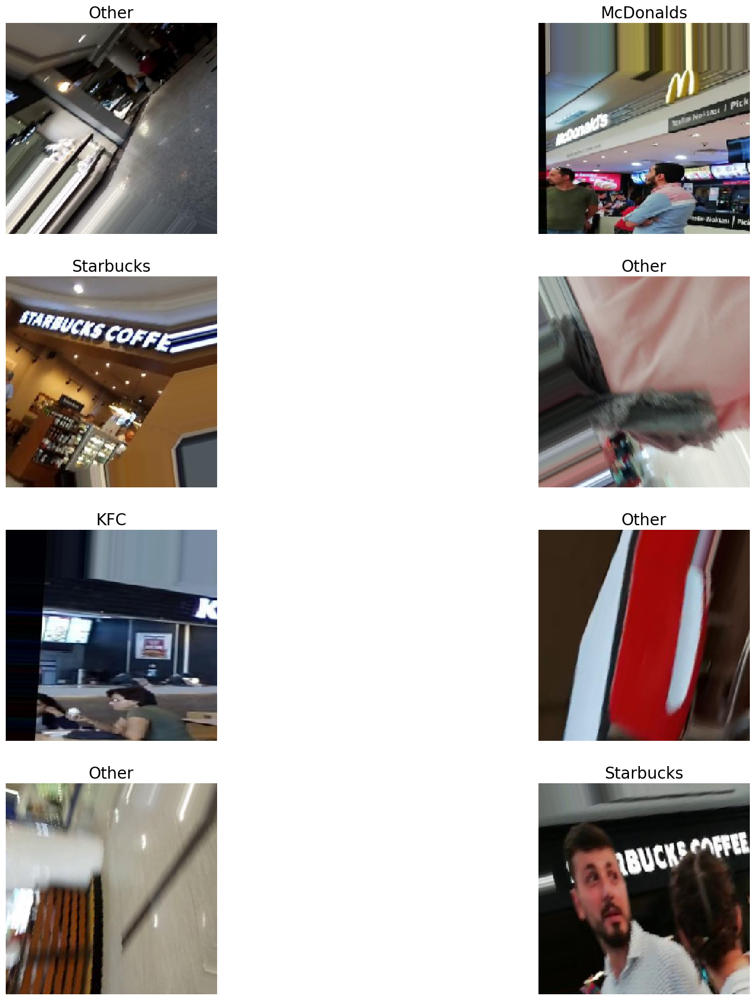

In [25]:
plots(imgs, rows=4, titles = labelNames, maxNum=8)

# Create model by Transfer Learning from InceptionV3

In [27]:
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dropout, Dense

# Base model
base_model = InceptionV3(
    weights='imagenet', 
    include_top=False, 
    input_shape=(224, 224, 3)
)
base_model.trainable = False  # Freeze base model layers

# Add custom top layers
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
predictions = Dense(len(selectedClasses), activation='softmax')(x)

# Build final model (corrected here)
model = Model(inputs=base_model.input, outputs=predictions)

# Show model structure
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_94 (Conv2D)  │ (None, 111, 111,  │        864 │ input_layer_2[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 111, 111,  │         96 │ conv2d_94[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_94       │ (None, 111, 111,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_95 (Conv2D)  │ (None, 109, 109,  │      9,216 │ activation_94[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 109, 109,  │         96 │ conv2d_95[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_95       │ (None, 109, 109,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_96 (Conv2D)  │ (None, 109, 109,  │     18,432 │ activation_95[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 109, 109,  │        192 │ conv2d_96[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_96       │ (None, 109, 109,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_4     │ (None, 54, 54,    │          0 │ activation_96[0]… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_97 (Conv2D)  │ (None, 54, 54,    │      5,120 │ max_pooling2d_4[… │
│                     │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 54, 54,    │        240 │ conv2d_97[0][0]   │
│ (BatchNormalizatio… │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_97       │ (None, 54, 54,    │          0 │ batch_normalizat… │
│ (Activation)        │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_98 (Conv2D)  │ (None, 52, 52,    │    138,240 │ activation_97[0]… │
│                     │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 52, 52,    │        576 │ conv2d_98[0][0]   │
│ (BatchNormalizatio… │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_98       │ (None, 52, 52,    │          0 │ batch_normalizat

 Total params: 21,815,078 (83.22 MB)

 Trainable params: 12,294 (48.02 KB)

 Non-trainable params: 21,802,784 (83.17 MB)

## 🔁 Keras Callbacks

📚 [Official Keras Callbacks Documentation](https://keras.io/callbacks/)

A **callback** is a set of functions applied during training at specific stages (e.g., after each epoch or batch). They allow you to:
- Monitor training and validation metrics
- Save the model during training
- Stop training early if no improvement is seen
- Log or visualize training progress

You pass callbacks using the `callbacks` argument in `model.fit()`.

---

## 🧠 `History` Callback

```python
keras.callbacks.History()
```

- Automatically applied to all Keras models.
- Stores training data such as loss and accuracy after each epoch.
- Returned by `model.fit()`.

```python
history = model.fit(...)
print(history.history)
```

---

## 💾 `ModelCheckpoint`

```python
keras.callbacks.ModelCheckpoint(
    filepath, monitor='val_loss', verbose=0,
    save_best_only=False, save_weights_only=False,
    mode='auto'
)
```

### 💡 Purpose:
Saves the model after every epoch or only when a performance metric improves.

### 📌 Parameters

| Parameter           | Description |
|---------------------|-------------|
| `filepath`          | Path to save the model. Use `{epoch:02d}` or `{val_loss:.2f}` to auto-format filenames. |
| `monitor`           | Metric to watch (e.g. `'val_loss'`, `'val_accuracy'`). |
| `verbose`           | `0` = silent, `1` = log messages. |
| `save_best_only`    | Save only if performance improves. |
| `save_weights_only` | Save only weights if `True`, else full model. |
| `mode`              | `'min'`, `'max'`, or `'auto'` (direction of improvement). |

### ✅ Example:

```python
filepath = "checkpoints/weights-epoch{epoch:02d}-val_acc{val_accuracy:.2f}.keras"
checkpoint = ModelCheckpoint(
    filepath=filepath,
    monitor='val_accuracy',
    verbose=1,
    save_best_only=True,
    mode='max'
)

callbacks_list = [checkpoint]
```

---

## ⏹️ `EarlyStopping`

```python
keras.callbacks.EarlyStopping(
    monitor='val_loss', min_delta=0, patience=0,
    verbose=0, mode='auto', baseline=None,
    restore_best_weights=False
)
```

### 💡 Purpose:
Stops training when the monitored metric no longer improves, saving time and avoiding overfitting.

### 📌 Parameters

| Parameter              | Description |
|------------------------|-------------|
| `monitor`              | Metric to monitor (e.g. `'val_loss'`). |
| `min_delta`            | Minimum change to qualify as improvement. |
| `patience`             | Epochs to wait before stopping. |
| `verbose`              | `0` = silent, `1` = print message. |
| `mode`                 | `'min'`, `'max'`, or `'auto'`. |
| `baseline`             | Baseline value to reach. |
| `restore_best_weights` | Restore weights from best-performing epoch. |

### ✅ Example:

```python
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True,
    verbose=1
)

callbacks_list = [checkpoint, early_stop]
```

---

## 🚀 Final Usage Example

```python
model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=50,
    callbacks=callbacks_list
)
```

- Saves best model automatically
- Stops training early if needed
- Keeps training history accessible

---

In [29]:
from tensorflow.keras.callbacks import ModelCheckpoint

modelName = "InceptionTutorial"
filepath = modelName + "_bestweights.keras"  # or .hdf5 with save_format='h5'

checkpoint = ModelCheckpoint(
    filepath,
    monitor='val_accuracy',  # use correct metric name
    verbose=1,
    save_best_only=True,
    mode='max',
    # save_format='h5'  # uncomment if using .h5
)

callbacks_list = [checkpoint]

# Compile the model 

In [31]:
from tensorflow.keras.optimizers import Adam

model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

## 🏋️‍♂️ Training the Model with `fit_generator()`

📚 [Keras Model Training Documentation](https://keras.io/models/model/)

The `fit_generator()` method trains a model using batches of data generated in real-time by a Python generator (or a `keras.utils.Sequence` instance). It is ideal for large datasets and when applying real-time data augmentation.

> ⚠️ Note: `fit_generator()` is deprecated in recent versions of Keras/TensorFlow. Use `model.fit()` with a generator instead. However, this reference is useful for legacy or Kaggle notebooks.

---

### 🔧 Syntax

```python
model.fit_generator(
    generator,
    steps_per_epoch=None,
    epochs=1,
    verbose=1,
    callbacks=None,
    validation_data=None,
    validation_steps=None,
    class_weight=None,
    max_queue_size=10,
    workers=1,
    use_multiprocessing=False,
    shuffle=True,
    initial_epoch=0
)
```

---

### 📌 Key Arguments

| Parameter             | Description |
|-----------------------|-------------|
| **generator**         | A generator or `Sequence` instance yielding `(inputs, targets)` or `(inputs, targets, sample_weights)`. |
| **steps_per_epoch**   | Number of batches per epoch. Usually: `len(dataset) // batch_size`. |
| **epochs**            | Number of full passes through the training data. |
| **verbose**           | `0` = silent, `1` = progress bar, `2` = one line per epoch. |
| **callbacks**         | List of `keras.callbacks.Callback` instances (e.g., `ModelCheckpoint`, `EarlyStopping`). |
| **validation_data**   | Can be a tuple `(x_val, y_val)` or a generator/Sequence. Used for validation at epoch end. |
| **validation_steps**  | Number of batches to draw from `validation_data` per epoch. Usually: `len(val_data) // batch_size`. |
| **class_weight**      | Dict mapping class indices to weights. Use to handle class imbalance. |
| **max_queue_size**    | Max size of the generator queue (default = 10). |
| **workers**           | Number of worker threads for data loading. |
| **use_multiprocessing** | Whether to use process-based threading. Avoid using non-picklable objects. |
| **shuffle**           | Whether to shuffle order of batches each epoch (only relevant for `Sequence`). |
| **initial_epoch**     | Epoch index to start training from (useful when resuming training). |

---

### ✅ Returns

A `History` object, which stores training/validation loss and metrics for each epoch.

```python
history = model.fit_generator(...)
print(history.history)
```

---

### 🚀 Example

```python
history = model.fit_generator(
    train_generator,
    steps_per_epoch = train_generator.samples // batch_size,
    epochs = 20,
    validation_data = validation_generator,
    validation_steps = validation_generator.samples // batch_size,
    callbacks = callbacks_list,
    verbose = 1
)
```

---

### 📝 Note

If you're using TensorFlow 2.0+, use `model.fit()` directly:

```python
model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=20,
    callbacks=callbacks_list
)
```

---

This method allows seamless integration of large datasets, data augmentation, and multi-process training—ideal for scalable deep learning tasks.

### Calculate steps_per_epoch and validation_steps For fit_generator 
Integer. Total number of steps (batches of samples) to yield from generator before declaring one epoch finished and starting the next epoch. ***It should typically be equal to the number of samples of your dataset divided by the batch size.*** Optional for Sequence: if unspecified, will use the len(generator) as a number of steps.


In [32]:
stepsPerEpoch= (train_generator.samples+ (batchSize-1)) // batchSize
print("stepsPerEpoch: ", stepsPerEpoch)

validationSteps=(validation_generator.samples+ (batchSize-1)) // batchSize
print("validationSteps: ", validationSteps)


#validationSteps=(test_generator.samples+ (batchSize-1)) // batchSize
#print("validationSteps: ", validationSteps)

stepsPerEpoch:  44
validationSteps:  11


## Train
Run more epochs for increasing the accuracy. For example:

**epochs = 30**

In [34]:
train_generator.reset()
validation_generator.reset()

# Fit the model
history = model.fit(
    train_generator, 
    validation_data=validation_generator,
    epochs=3,
    steps_per_epoch=stepsPerEpoch,
    validation_steps=validationSteps,
    callbacks=callbacks_list,
    verbose=1
)

Epoch 1/3
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.1954 - loss: 34.9167
Epoch 1: val_accuracy improved from -inf to 0.46377, saving model to InceptionTutorial_bestweights.keras
44/44 ━━━━━━━━━━━━━━━━━━━━ 87s 2s/step - accuracy: 0.1962 - loss: 34.8593 - val_accuracy: 0.4638 - val_loss: 15.0529
Epoch 2/3
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 728ms/step - accuracy: 0.2764 - loss: 29.9687
Epoch 2: val_accuracy improved from 0.46377 to 0.47536, saving model to InceptionTutorial_bestweights.keras
44/44 ━━━━━━━━━━━━━━━━━━━━ 41s 920ms/step - accuracy: 0.2765 - loss: 29.9537 - val_accuracy: 0.4754 - val_loss: 13.9079
Epoch 3/3
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 649ms/step - accuracy: 0.3028 - loss: 27.1588
Epoch 3: val_accuracy did not improve from 0.47536
44/44 ━━━━━━━━━━━━━━━━━━━━ 36s 816ms/step - accuracy: 0.3032 - loss: 27.1461 - val_accuracy: 0.4725 - val_loss: 9.8727


## Show Training History
We can plot the accuracy and loss values for each epoch using the history object as follows.

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])


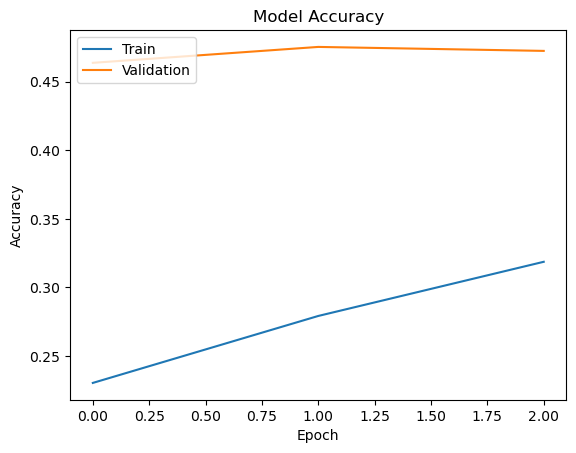

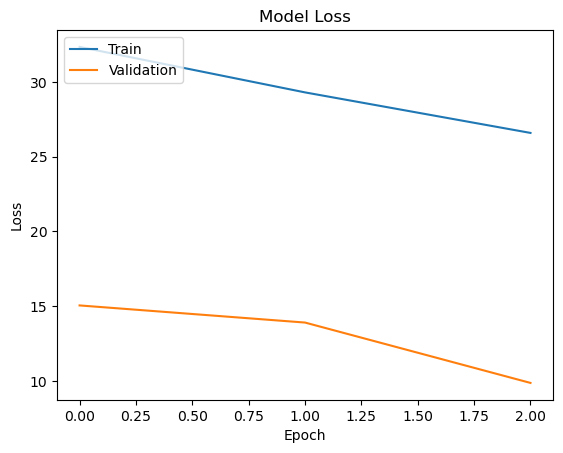

In [36]:
# List all metrics in history
print(history.history.keys())

# Plot accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Save the model and last weights

In [38]:
import time

timestr = time.strftime("%Y%m%d_%H%M%S")
modelName = "InceptionTutorial"

# Save model architecture
model_json = model.to_json()
with open(f"{timestr}_{modelName}_MODEL_3.json", "w") as json_file:
    json_file.write(model_json)

# Save weights
model.save_weights(f"{timestr}_{modelName}_3_LAST_WEIGHTS.weights.h5")

# Upload the model and best weights

In [40]:
# load json and create model
json_file = open('20250722_220603_InceptionTutorial_MODEL_3.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
model = model_from_json(loaded_model_json)

In [42]:
# load weights into new model
model.load_weights("InceptionTutorial_bestweights.keras")

# Evaulate the model

***evaluate_generator(generator, steps=None, max_queue_size=10, workers=1, use_multiprocessing=False, verbose=0)***

Evaluates the model on a data generator.

The generator should return the same kind of data as accepted by test_on_batch.

## Arguments

***generator:*** Generator yielding tuples (inputs, targets) or (inputs, targets, sample_weights) or an instance of Sequence (keras.utils.Sequence) object in order to avoid duplicate data when using multiprocessing.

***steps:*** Total number of steps (batches of samples) to yield from generator before stopping. Optional for Sequence: if unspecified, will use the len(generator) as a number of steps.

***max_queue_size:*** maximum size for the generator queue

***workers:*** Integer. Maximum number of processes to spin up when using process based threading. If unspecified, workers will default to 1. If 0, will execute the generator on the main thread.

***use_multiprocessing:*** if True, use process based threading. Note that because this implementation relies on multiprocessing, you should not pass non picklable arguments to the generator as they can't be passed easily to children processes.

***verbose:*** verbosity mode, 0 or 1.

***Returns***
Scalar test loss (if the model has a single output and no metrics) or list of scalars (if the model has multiple outputs and/or metrics). The attribute model.metrics_names will give you the display labels for the scalar outputs.

In [45]:
validation_generator.reset()

score = model.evaluate(
    validation_generator,
    steps=(validation_generator.samples + batchSize - 1) // batchSize
)

print("For validation data set; Loss:", score[0], " Accuracy:", score[1])

11/11 ━━━━━━━━━━━━━━━━━━━━ 18s 1s/step - accuracy: 0.4588 - loss: 13.6381
For validation data set; Loss: 13.403132438659668  Accuracy: 0.4753623306751251


In [46]:
test_generator.reset()

score = model.evaluate(
    test_generator,
    steps=(test_generator.samples + batchSize - 1) // batchSize
)

print("For test data set; Loss:", score[0], " Accuracy:", score[1])

18/18 ━━━━━━━━━━━━━━━━━━━━ 17s 950ms/step - accuracy: 0.2805 - loss: 17.7789
For test data set; Loss: 15.942928314208984  Accuracy: 0.4375


# Predict Generator
https://keras.io/models/sequential/

predict_generator(generator, steps=None, max_queue_size=10, workers=1, use_multiprocessing=False, verbose=0)

Generates predictions for the input samples from a data generator.

The generator should return the same kind of data as accepted by predict_on_batch.

## Arguments

### generator: 
Generator yielding batches of input samples or an instance of Sequence (keras.utils.Sequence) object in order to avoid duplicate data when using multiprocessing.

### steps: 
Total number of steps (batches of samples) to yield from generator before stopping. Optional for Sequence: if unspecified, will use the len(generator) as a number of steps.

### max_queue_size: 
Maximum size for the generator queue.

### workers: 
Integer. Maximum number of processes to spin up when using process based threading. If unspecified, workers will default to 1. If 0, will execute the generator on the main thread.

### use_multiprocessing: 
If True, use process based threading. Note that because this implementation relies on multiprocessing, you should not pass non picklable arguments to the generator as they can't be passed easily to children processes.

### verbose: 
verbosity mode, 0 or 1.

## Returns

Numpy array(s) of predictions.

# Make Predictions

You need to **reset** the test_generator before whenever you call the predict_generator. This is important, if you forget to reset the test_generator you will get outputs in a weird order.

In [48]:
test_generator.reset()
testStep = (test_generator.samples + (batchSize - 1)) // batchSize
print("testStep:", testStep)

predictions = model.predict(test_generator, steps=testStep, verbose=1)
print("Number of predictions:", len(predictions))

testStep: 18
18/18 ━━━━━━━━━━━━━━━━━━━━ 18s 851ms/step
Number of predictions: 560


In [49]:
len(predictions)

560


## Decode Labels

Now ***predictions*** has the probabilities for 6 classes for each test case!

We can find the class with the highest probability as the prediction label as follows:


In [50]:
predicted_class_indices=np.argmax(predictions,axis=1)
print(predicted_class_indices)
len(predicted_class_indices)

[3 3 3 3 3 3 3 3 3 0 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 0 3 3 3 3 3 3 3 3 0 0 0
 0 3 3 3 3 3 0 3 3 3 3 3 3 3 0 3 3 3 3 3 0 3 3 0 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 0 0 0 0 3 0 3 0 3 0 0 3 3 0 3 3 3 0 0 0 0 3 3 3
 3 0 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 0 3 3 3 3 3 3 0 3 3 3
 3 3 3 3 3 3 3 0 3 3 3 3 3 3 3 3 3 3 0 3 3 3 3 0 3 0 3 0 3 3 3 3 3 3 2 0 3
 3 3 3 3 0 3 3 3 3 3 3 3 3 3 3 3 3 3 3 0 3 0 3 0 0 0 0 3 0 0 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 0 3 3 3 3 3 3 0 3 3 3 3 3 3 3 3 0 3 2 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 0 3 3 0 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 2 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 5 3 3 3 3 3 3 3 3 3 3 3 3 3 3 0 3
 0 3 3 3 3 3 3 3 3 3 3 3 4 3 3 3 4 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 0 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 0 3 3 3 3 3 3 3 3 3 0 5 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 0 0 3 3 3 3 3 3 3 3 3 

560

***predicted_class_indices** has the predicted labels, but you can’t simply tell what the predictions are, because all you can see is numbers like 0,1,4,1,0,6…
and most importantly you need to map the predicted labels with their unique ids such as filenames to find out what you predicted for which image.

In [51]:
labels = (test_generator.class_indices)
print(labels)

{'Burger King': 0, 'KFC': 1, 'McDonalds': 2, 'Other': 3, 'Starbucks': 4, 'Subway': 5}


In [52]:
labels = dict((v,k) for k,v in labels.items())
print(labels)

{0: 'Burger King', 1: 'KFC', 2: 'McDonalds', 3: 'Other', 4: 'Starbucks', 5: 'Subway'}


In [53]:
predictedLables= [labels[k] for k in predicted_class_indices]
print(predictedLables)
len(predictedLables)

['Other', 'Other', 'Other', 'Other', 'Other', 'Other', 'Other', 'Other', 'Other', 'Burger King', 'Other', 'Other', 'Other', 'Other', 'Other', 'Other', 'Other', 'Other', 'Other', 'Other', 'Other', 'Other', 'Other', 'Other', 'Other', 'Burger King', 'Other', 'Other', 'Other', 'Other', 'Other', 'Other', 'Other', 'Other', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Other', 'Other', 'Other', 'Other', 'Other', 'Burger King', 'Other', 'Other', 'Other', 'Other', 'Other', 'Other', 'Other', 'Burger King', 'Other', 'Other', 'Other', 'Other', 'Other', 'Burger King', 'Other', 'Other', 'Burger King', 'Other', 'Other', 'Other', 'Other', 'Other', 'Other', 'Other', 'Other', 'Other', 'Other', 'Other', 'Other', 'Other', 'Other', 'Other', 'Other', 'Other', 'Other', 'Other', 'Other', 'Other', 'Other', 'Other', 'Other', 'Other', 'Other', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Other', 'Burger King', 'Other', 'Burger King', 'Other', 'Burger King', 'Burger King', 'Other', 

560

***predictedLabels*** have the labels predicted by the model. We need to locate ***the actual labels*** for the same test data as follows:

In [54]:
actualLables= [labels[k] for k in test_generator.classes]
print(actualLables)
len(actualLables)

['Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger King', 'Burger K

560

# Evaulate the results

Below, we will see several methods for evaluating a classifier.

More on http://www.cse.chalmers.se/~richajo/dit865/files/Classification%20evaluation%20examples.html

## Accuracy
The most classical evaluation metric for classifiers is the accuracy, which corresponds to the proportion of correctly classified instances. 

In [55]:
accuracy_score(actualLables, predictedLables)

0.4375

## Evaluation metrics based on a confusion matrix

A confusion matrix is such that the cell at row  i  and column  j  is equal to the number of observations known to be in group  i  but predicted to be in group  j .



In [56]:
matrix = confusion_matrix(actualLables, predictedLables)
print(labels)
matrix

{0: 'Burger King', 1: 'KFC', 2: 'McDonalds', 3: 'Other', 4: 'Starbucks', 5: 'Subway'}


array([[ 26,   0,   0, 127,   0,   0],
       [  3,   0,   0,  17,   0,   0],
       [ 17,   0,   2,  77,   0,   0],
       [  7,   0,   1, 212,   2,   2],
       [ 16,   0,   2,  13,   5,   2],
       [ 12,   0,   2,  15,   0,   0]], dtype=int64)

## The precision and recall metrics
Several metrics can be derived from a confusion matrix. (See the Wikipedia article.) In particular, they tend to be based on the special case of a confusion matrix, where we assign one class to be the "positive" class that is important to us. This is sometimes called a table of confusion. In such a table, we speak of true positives, false positives, false negatives, and true negatives.

The precision and recall metrics are probably the most common metrics derived from such a table.

P  = TP / (TP + FP)

R  = TP / (TP + FN)

For example, What's the precision and recall of 'Burger King' in this case?

The utility function ***classification_report*** prints the precision and recall values for all the categories. (The  F1  score combines the precision and recall values into a single value.)

In [57]:
print(classification_report(actualLables, predictedLables))

              precision    recall  f1-score   support

 Burger King       0.32      0.17      0.22       153
         KFC       0.00      0.00      0.00        20
   McDonalds       0.29      0.02      0.04        96
       Other       0.46      0.95      0.62       224
   Starbucks       0.71      0.13      0.22        38
      Subway       0.00      0.00      0.00        29

    accuracy                           0.44       560
   macro avg       0.30      0.21      0.18       560
weighted avg       0.37      0.44      0.33       560



In [58]:
recall_score( actualLables, predictedLables,average='weighted') 

0.4375

In [59]:
precision_score( actualLables, predictedLables,average='weighted') 

0.3690953315527223

## Plot the confusion matrix

In [60]:
#Prepared code that is taken from SKLearn Website, Creates Confusion Matrix
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

Confusion matrix, without normalization
[[ 26   0   0 127   0   0]
 [  3   0   0  17   0   0]
 [ 17   0   2  77   0   0]
 [  7   0   1 212   2   2]
 [ 16   0   2  13   5   2]
 [ 12   0   2  15   0   0]]


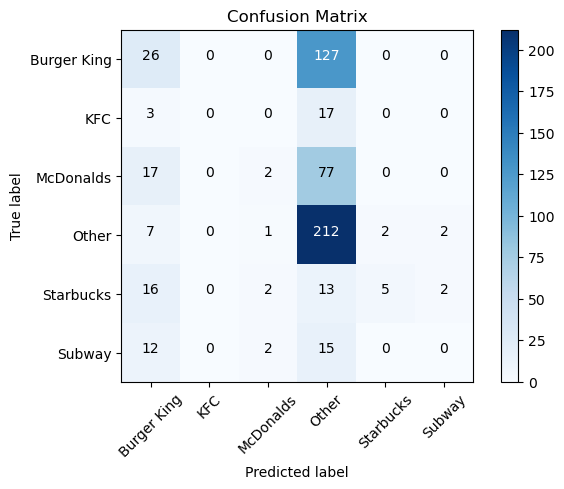

In [61]:
cm_plot_labels = selectedClasses
plot_confusion_matrix(matrix,cm_plot_labels, normalize=False
                      , title = 'Confusion Matrix')

# Save Predictions
Finally, save the results to a CSV file.

In [62]:
filenames=test_generator.filenames
directory= test_generator.directory
results=pd.DataFrame({"Directory":directory,
                      "Filename":filenames,
                      "Predictions":predictedLables,
                     "Actuals": actualLables })
results.to_csv("results.csv",index=False)

# Show some sample predictions with corresponding true labels


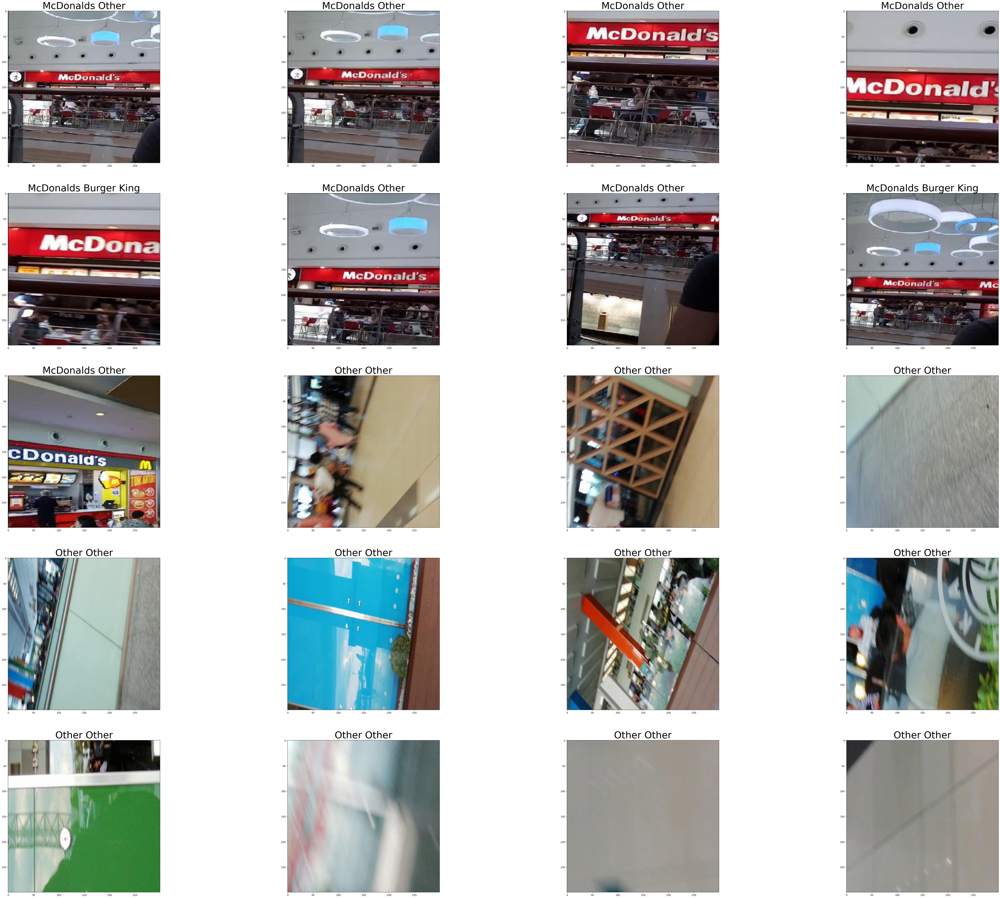

In [64]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

res = results[260:280]
images = []

# Construct image paths from DataFrame
for img_path in "./" + res['Directory'] + "/" + res['Filename']:
    images.append(mpimg.imread(img_path))

# Plotting
plt.figure(figsize=(80, 80))
columns = 4
rows = (len(images) // columns) + 1  # Ensure integer row count

for i, image in enumerate(images):
    ax = plt.subplot(rows, columns, i + 1)
    ax.set_title(res['Actuals'].iloc[i] + " " + res['Predictions'].iloc[i], fontsize=40)
    plt.imshow(image)